<a href="https://colab.research.google.com/github/PreetiKharb/Lending-Investment/blob/main/Lending.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Lending Club Case Study: Exploratory Data Analysis </h1>

## Business Objective:


Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). The credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders.

Objective is to identify the risky loan applicants at the time of loan application so that such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

In other words, to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default. The company can utilise this knowledge for its portfolio and risk assessment. And thus minimise the risk of losing money while lending to customers.

##Exploratory Data Analysis

###Imports and data load

In [28]:
!pip install plotly

In [29]:
# Import all the necessary libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [30]:
#supress scientific notation of values
pd.options.display.float_format = '{:.2f}'.format
#increasing max number of columns and rows  displayed with pandas.
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 100)

In [31]:
# Download csv from my drive
!gdown --id 1pI-JE1bqoTBS4MFP6lPbto9Lwp3ojcH5 --output loan.csv
# !gdown --id 1dwg6UxJ5FKMNpoklY2CaMoqsM9AI8jlA --output loan.csv


!gdown --id 1n7vqFARP5s8PMFJ4I-YEX2ixh1Y_JwdZ --output loan_dict.xlsx

Downloading...
From: https://drive.google.com/uc?id=1pI-JE1bqoTBS4MFP6lPbto9Lwp3ojcH5
To: /content/loan.csv
34.8MB [00:00, 162MB/s]
Downloading...
From: https://drive.google.com/uc?id=1n7vqFARP5s8PMFJ4I-YEX2ixh1Y_JwdZ
To: /content/loan_dict.xlsx
100% 23.6k/23.6k [00:00<00:00, 39.6MB/s]


In [32]:
loan_dict = pd.read_excel('loan_dict.xlsx', skipfooter=1)
loan_dict.LoanStatNew = loan_dict.LoanStatNew.str.strip()
loan_dict.head()

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...


In [33]:
#Create companies data frame
loans = pd.read_csv('loan.csv')
loans.columns = loans.columns.str.strip()
loans.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.



,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.00,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.00,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,nan,nan,3,0,13648,83.70%,9,f,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.00,nan,1,INDIVIDUAL,nan,nan,nan,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan
1,1077430,1314167,2500,2500,2500.00,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.00,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,nan,nan,3,0,1687,9.40%,4,f,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.00,nan,1,INDIVIDUAL,nan,nan,nan,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan
2,1077175,1313524,2400,2400,2400.00,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.00,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,nan,nan,2,0,2956,98.50%,10,f,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.00,nan,1,INDIVIDUAL,nan,nan,nan,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan
3,1076863,1277178,10000,10000,10000.00,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.00,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.00,nan,10,0,5598,21%,37,f,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.00,nan,1,INDIVIDUAL,nan,nan,nan,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,

After veryfying the data in loans df and loan dict df, we can see that the columns named 'verification_status_joint' is named 'verified_status_joint' in the dictionary file. The data related to FICO is not present in the loans data provided. 


In [34]:
#Columns not present in dictionary but in loans.csv
loans.columns[~loans.columns.isin(loan_dict['LoanStatNew'])]

Index(['verification_status_joint'], dtype='object')

In [35]:
#Columns present in dictionary but not in loans.csv
loan_dict['LoanStatNew'][~loan_dict['LoanStatNew'].isin(loans.columns.str.strip())]

21           fico_range_high
22            fico_range_low
37      last_fico_range_high
38       last_fico_range_low
113    verified_status_joint
115                      NaN
Name: LoanStatNew, dtype: object

### Data Understanding

In [36]:
#shape of data frame
loans.shape

(39717, 111)

In [37]:
loans.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object

In [38]:
loans.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,14035.00,2786.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39717.00,39661.00,0.00,39717.00,0.00,0.00,0.00,39717.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,39661.00,39717.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,39020.00,39678.00,0.00,0.00,0.00,0.00
mean,683131.91,850463.56,11219.44,10947.71,10397.45,324.56,68968.93,13.32,0.15,0.87,35.90,69.70,9.29,0.06,13382.53,22.09,51.23,50.99,12153.60,11567.15,9793.35,2263.66,1.36,95.22,12.41,2678.83,0.00,nan,1.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.04,0.00,nan,nan,nan,nan
std,210694.13,265678.31,7456.67,7187.24,7128.45,208.87,63793.77,6.68,0.49,1.07,22.02,43.82,4.40,0.24,15885.02,11.40,375.17,373.82,9042.04,8942.67,7065.52,2608.11,7.29,688.74,148.67,4447.14,0.00,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.20,0.00,nan,nan,nan,nan
min,54734.00,70699.00,500.00,500.00,0.00,15.69,4000.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,nan,1.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan
25%,516221.00,666780.00,5500.00,5400.00,5000.00,167.02,40404.00,8.17,0.00,0.00,18.00,22.00,6.00,0.00,3703.00,13.00,0.00,0.00,5576.93,5112.31,4600.00,662.18,0.00,0.00,0.00,218.68,0.00,nan,1.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan
50%,665665.00,850812.00,10000.00,9600.00,8975.00,280.22,59000.00,13.40,0.00,1.00,34.00,90.00,9.00,0.00,8850.00,20.00,0.00,0.00,9899.64,9287.15,8000.00,1348.91,0.00,0.00,0.00,546.14,0.00,nan,1.00,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0

In [39]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


###Data Cleaning

In [40]:
#The unique keys and number of unique entries are correctly identified.
print('Dataframe shape before', loans.shape)
loans.drop_duplicates()
print('Dataframe shape after', loans.shape)

Dataframe shape before (39717, 111)
Dataframe shape after (39717, 111)


There are no duplicates in the data frame


In [41]:
# Is there any row which does not have any data at all, i.e. all the columns are null for the row?
loans.isnull().all(1).value_counts()

False    39717
dtype: int64

In [42]:
def checkNullValues():
  null_val = round(100*(loans.isnull().sum()/len(loans.index)), 2)
  return null_val[null_val > 0]

In [43]:
# Missing values per column expressed as % of total number of values
null_values = checkNullValues()
print(null_values)

emp_title                          6.19
emp_length                         2.71
desc                              32.58
title                              0.03
mths_since_last_delinq            64.66
mths_since_last_record            92.99
revol_util                         0.13
last_pymnt_d                       0.18
next_pymnt_d                      97.13
last_credit_pull_d                 0.01
collections_12_mths_ex_med         0.14
mths_since_last_major_derog      100.00
annual_inc_joint                 100.00
dti_joint                        100.00
verification_status_joint        100.00
tot_coll_amt                     100.00
tot_cur_bal                      100.00
open_acc_6m                      100.00
open_il_6m                       100.00
open_il_12m                      100.00
open_il_24m                      100.00
mths_since_rcnt_il               100.00
total_bal_il                     100.00
il_util                          100.00
open_rv_12m                      100.00


In [44]:
#Removing columns which has more than 90% null values in it.
loans.drop(null_values[ null_values >= 90 ].index, axis=1, inplace=True)

In [45]:
null_values = round(100*(loans.isnull().sum()/len(loans.index)), 2)
null_values[null_values > 50]

mths_since_last_delinq   64.66
dtype: float64

Above we can see that **mths_since_last_delinq** has aproximately **65%** of **null** values, here if the column is required for analysis we should have imputed the values using mode as it is categorical value. But since we do not need this data we can drop the column

In [46]:
loans.drop(['mths_since_last_delinq'], axis=1, inplace=True)

In [47]:
# Check the shape after dropping columns where more then 50%
loans.shape

(39717, 54)

In [48]:
#Finding number of unique values in each vcolumn
loans.nunique().sort_values()

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
application_type                  1
policy_code                       1
initial_list_status               1
collections_12_mths_ex_med        1
pymnt_plan                        1
term                              2
pub_rec_bankruptcies              3
verification_status               3
loan_status                       3
pub_rec                           5
home_ownership                    5
grade                             7
inq_last_6mths                    9
emp_length                       11
delinq_2yrs                      11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
last_pymnt_d                    101
last_credit_pull_d              106
int_rate                    

There are a multiple columns having a single unique value or all unique values. I am keeping ID as one unique column just in case and rest i am removing as these may have nothing much to contribute to the analysis i.e. columns which are far from being the driving columns towards loan default.

These columns are:


1. id, member_id, url :
is a random number given to the member, does not contribute to analysis and is a URL for LC page for corresponding to each memberid, nothing to do with loan default

2. application_type, acc_now_delinq, delinq_amnt,pymnt_plan, initial_list_status, policy_code, collections_12_mths_ex_med, tax_liens, chargeoff_within_12_mths: value for entire dataset has only one value, therefore nothing to contribute for analysis, to be removed.

3. zip_code :
first 3 digits of the 5 digit zip code are visible, also is redundant with addr_state, does not contribute to analysis

4. desc: gives the loan description provided by the borrower, does not contribute to the analysis

5. funded_amnt_inv, funded_amnt,sub_grade, delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt_inv, total_rec_prncp, total_rec_int, total_rec_late_fee, recoveries,
collection_recovery_fee, last_pymnt_d, last_pymnt_amnt, last_credit_pull_d: As these columns are mostly either repetative (for ex funded_amnt_inv is simliar to funded_amnt and in 95% of case loan_amnt) or they have data which is not available during the application time.


In [49]:
loans.drop(['id','member_id', 'url'], axis=1, inplace=True)
loans.drop(['application_type','acc_now_delinq','delinq_amnt','pymnt_plan','initial_list_status','policy_code','collections_12_mths_ex_med','tax_liens','chargeoff_within_12_mths'], axis=1, inplace=True)
loans.drop(['zip_code'], axis=1, inplace=True)
loans.drop(['desc'], axis=1, inplace=True) 
loans.drop(['funded_amnt_inv','sub_grade', 'delinq_2yrs','earliest_cr_line','inq_last_6mths','open_acc','revol_bal','total_acc','out_prncp','out_prncp_inv','total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d'], axis=1, inplace=True) 

In [50]:
# dropped 9 more columns
loans.shape

(39717, 21)

In [51]:
#Finding number of unique values, printing high unique valued columns
loans.nunique().sort_values(ascending=False).head(5)

total_pymnt    37850
emp_title      28820
title          19615
installment    15383
annual_inc      5318
dtype: int64

In [52]:
#emp_title, title
print(loans['emp_title'].nunique())
print(loans['emp_title'].unique())

print(loans['title'].nunique())
print(loans['title'].unique())

# does not make sense to me as i cant segment it into useful categories, so drop it
loans.drop(['emp_title','title'], axis=1, inplace=True)

28820
[nan 'Ryder' 'AIR RESOURCES BOARD' ... 'FiSite Research'
 'Squarewave Solutions, Ltd.' 'Evergreen Center']
19615
['Computer' 'bike' 'real estate business' ... 'Retiring credit card debt'
 'MBA Loan Consolidation' 'JAL Loan']


**emp_title, and title** columns have text values which are more unique values.

In [53]:
checkNullValues()

emp_length             2.71
revol_util             0.13
pub_rec_bankruptcies   1.75
dtype: float64

In [54]:
# remove rows with null data
loans = loans[~loans['emp_length'].isnull()]
loans = loans[~loans['pub_rec_bankruptcies'].isnull()]


In [55]:
# Check null values
null_values = round(100*(loans.isnull().sum()/len(loans.index)), 2)
null_values[null_values > 0]

revol_util   0.12
dtype: float64

In [56]:
#Removing Current status data as this would not add any value to the analysis
loans = loans[loans['loan_status']!='Current']

In [57]:
# Check the final shape after cleaning the data
print(loans.shape)
print(loans.columns)


(36847, 19)
Index(['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment', 'grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'purpose', 'addr_state', 'dti', 'pub_rec',
       'revol_util', 'total_pymnt', 'pub_rec_bankruptcies'],
      dtype='object')


In [58]:
print(loans.term.value_counts())

# Remove additional space
loans['term'] = loans['term'].str.strip('')


 36 months    27590
 60 months     9257
Name: term, dtype: int64


#### Data conversions

In [59]:
# Handle dates
loans.issue_d = pd.to_datetime(loans.issue_d, format='%b-%y')

loans[['issue_d']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36847 entries, 0 to 39680
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   issue_d  36847 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 575.7 KB


In [60]:
loans['int_rate'] = loans['int_rate'].str.strip('%').astype('float')
loans['revol_util'] = loans['revol_util'].str.strip('%').astype('float')

#### Standardising Values

In [61]:
# 2 decimal points
loans.total_pymnt= round(loans.total_pymnt,2)

### Derived Variables

In [62]:
loans['issue_d_year'] = loans.issue_d.dt.year
loans['issue_d_month'] = loans.issue_d.dt.month
loans['issue_d_weekday'] = loans.issue_d.dt.weekday

#Create Derived categorical variable
loans['interest_rate_buckets'] = round(loans['int_rate'])
loans['loan_amnt_bin'] = pd.cut(loans['loan_amnt'], [x for x in range(0, 36000, 5000)], labels=[str(x)+'-'+str(x+5)+'k' for x in range (0, 35, 5)])
loans['dti_bin'] = pd.cut(loans['dti'], [0,5,10,15,20,25,30], labels=['0-5','5-10','10-15','15-20','20-25','25-30'])

loans['income_bin'] = loans['annual_inc']/20000
loans['income_bin'] = loans['income_bin'].astype(int)
loans['income_bin_label'] = (loans.income_bin*10).astype('str')+' - '+(loans.income_bin*10+10).astype('str')+'k'


loans['revol_util_bin'] = round(loans['revol_util']/5)

### Univariate and Segmented Univariate Analysis

In [63]:
charged_off_df = loans[loans['loan_status']=='Charged Off']
fully_paid_df = loans[loans['loan_status']=='Fully Paid']

In [64]:
# This function plot the count of cases in each category section
# This take 3 input parameters= col ,label and plot
def univariateCategorical(col, label, plot='pie'):
  if plot=='pie':
    fig = px.pie(loans, names=col)
    fig.update_layout(height=500, width=800, title_text= label +" distribution")
  else:
    grp_total = loans.groupby(col).count().reset_index()
    fig = px.bar(grp_total, y=col, x='loan_amnt', color=col, text=grp_total.loan_amnt, orientation='h')
    fig.update_layout(height=500, width=800, title_text= label +" distribution")
  
  return fig

In [65]:
# This function plot the count of cases in each category section
# This take 2 input parameters= col and label
def univariateContinous(col, label):
  print(loans[col].describe(percentiles=[0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99]))

  fig = make_subplots(rows=1, cols=2, subplot_titles=("Distribution Plot","Loan Status Box Plot"))
  fig.add_trace(go.Histogram(x=loans[col],xbins=dict( # bins used for histogram
    ),), row=1, col=1)
  fig.add_trace(go.Box(y=loans[col], x=loans['loan_status'], name=label), row=1, col=2)
  fig.update_layout(showlegend=False, title_text=label +" distribution")
  fig.show()

In [66]:
# This function plot the percentage of charged off cases in each category section
# This take 2 input parameters= Category and orientation
def plotChargedOffData(category, orient='h'):
  grp_co = charged_off_df.groupby(category).count().reset_index()
  grp_total = loans.groupby(category).count().reset_index()
  
  grp_co['total_count'] = [(grp_total[grp_total[category]==total]['loan_amnt']) for co in grp_co[category] for total in grp_total[category] if co==total]
  grp_co['total_count'] =grp_co['total_count'].astype(int)
  grp_co['percentage_charged_off'] = (grp_co['loan_amnt']/grp_co['total_count']*100).astype(int)

  # ticktext = [t*5 for t in grp_co[category]]
  # ticktext =[f'{n}%' for n in ticktext]

  fig = go.Figure()
  if orient=='h':
    fig.add_trace(go.Bar(y=grp_co[category],
                        x=grp_co['percentage_charged_off'], 
                        orientation='h', 
                        text = (grp_co['percentage_charged_off'].round(2).astype(str) +" % of "+ grp_co.total_count.astype(str)), 
                        textposition="inside", 
                        marker_color= grp_co['percentage_charged_off'],
                        name='Charged Off'
                    ))
    fig.update_layout(barmode='group', yaxis={'title':category}, xaxis={'title':'% Charged off'}, title_text="Number of Charged off for each "+ category, hovermode="x")
  else :
    fig.add_trace(go.Bar(x=grp_co[category],
                  y=grp_co['percentage_charged_off'], 
                  orientation='v', 
                  text = (grp_co['percentage_charged_off'].round(2).astype(str) +" % of<br> "+ grp_co.total_count.astype(str)), 
                  textposition="inside", 
                  textfont=dict(
                      size=14,
                      color="Black"
                  ),
                  marker_color= grp_co['percentage_charged_off'],
                  name='Charged Off'
              ))
    fig.update_layout(barmode='group', xaxis={'title':category,'tickmode' : 'array','tickvals' :grp_co[category]}, yaxis={'title':'% Charged off'}, title_text="Number of Charged off for each "+ category)

  return fig

In [67]:
loans.shape

(36847, 28)

####Loan Amount(loan_amnt)

In [68]:
univariateContinous('loan_amnt','Loan Amount')

count   36847.00
mean    11141.33
std      7369.99
min       500.00
5%       2400.00
10%      3200.00
25%      5500.00
50%     10000.00
75%     15000.00
90%     22000.00
95%     25000.00
99%     35000.00
max     35000.00
Name: loan_amnt, dtype: float64


**Observations:**
From the above plots, it is implied that a large number or borrowers took loan of amount around 10000.
The meadian of distribution is 10000. And very few borrowers took loan with amount more than 30000.


* The loan amount distribution is slightly right-skewed with mean greater than the median. 
* Most of the loans that have granted < 15000 (75 percentile value)
* The loan amount trend has a spike around each 5000 boundary.
* Charged off loans are shifted towards higher average loan amount than the Fully Paid.







In [69]:
#(loans['grade'].value_counts(normalize=True)*100).sort_index()

In [70]:
fig1 = univariateCategorical('loan_amnt_bin','Loan amount','bar')
fig2 = plotChargedOffData('loan_amnt_bin')
fig2.update_layout(width=600)
fig1.show()
fig2.show()


**Observation**:

The percentage of loans getting charged off increase as we increases towards higher range of loan amount.

#### Funded Amount(funded_amnt)

In [71]:
univariateContinous('loan_amnt','Loan Amount')

count   36847.00
mean    11141.33
std      7369.99
min       500.00
5%       2400.00
10%      3200.00
25%      5500.00
50%     10000.00
75%     15000.00
90%     22000.00
95%     25000.00
99%     35000.00
max     35000.00
Name: loan_amnt, dtype: float64


**Observartion:** Out of charged off loans, we were able to recover 36 Million out of 62 Million. This resulted in 42%(26 Million) financial loss to the company. The company made approximately 68 Million.

#### Interest Rate

In [72]:
univariateContinous('int_rate','Interest Rate')

count   36847.00
mean       11.99
std         3.70
min         5.42
5%          6.17
10%         7.14
25%         8.94
50%        11.86
75%        14.52
90%        16.82
95%        18.39
99%        20.99
max        24.40
Name: int_rate, dtype: float64


In [73]:
fig1 = univariateCategorical('interest_rate_buckets','Interest Rate Buckets','bar')
fig2 = plotChargedOffData('interest_rate_buckets','v')
fig2.update_layout(height=700, width=1500)
fig1.show()
fig2.show()

Observations: It shows that 75% of the total loans have below '14.46%' and rest has above that. But the charged off percentage increase with the increase in interest rate.

#### DTI

In [74]:
univariateContinous('dti','Debt to Income Ration')

count   36847.00
mean       13.33
std         6.65
min         0.00
5%          2.18
10%         4.14
25%         8.21
50%        13.42
75%        18.59
90%        22.32
95%        23.81
99%        26.54
max        29.99
Name: dti, dtype: float64


In [75]:
fig2 = univariateCategorical('dti_bin','Debt to Income','bar')
fig3 = plotChargedOffData('dti_bin','h')
fig3.update_layout(width=900,height=700)
fig2.show()
fig3.show()

Observation: The highest percentage of number of loans is between 10-15 dti.
The charged off percentage increase with increase in dti(except 25-30 bucket).

#### Revol util

In [76]:
univariateContinous('revol_util','Revolve Util')

count   36800.00
mean       48.99
std        28.31
min         0.00
5%          2.80
10%         8.70
25%        25.60
50%        49.50
75%        72.50
90%        87.90
95%        93.60
99%        98.50
max        99.90
Name: revol_util, dtype: float64


In [77]:
fig2 = univariateCategorical('revol_util_bin','Revol Util','bar')
fig3 = plotChargedOffData('revol_util_bin','v')
fig3.update_layout(width=1700,height=700)
fig2.show()
fig3.show()

#### Annual Income

In [78]:
univariateContinous('annual_inc','Annual Income')

count     36847.00
mean      69404.48
std       64027.47
min        4000.00
5%        24000.00
10%       30000.00
25%       41004.00
50%       60000.00
75%       83000.00
90%      116685.60
95%      141998.80
99%      235000.00
max     6000000.00
Name: annual_inc, dtype: float64


The annual income reprted by the borrowers range from min of 4,000 to max of 6,000,000.
Median annual income is around 60,000
There are alot of outlier we will need to remove outliers in order to undertstand annual income data

In [79]:
# Let's get rid of outliers to analyze annual income. 
# Keep only the ones that are within +3 to -3 standard deviations in the column 'Data'.
loans = loans[np.abs(loans.annual_inc-loans.annual_inc.mean()) <= (3*loans.annual_inc.std())]

In [80]:
univariateContinous('annual_inc','Annual Income')

count    36579.00
mean     66469.08
std      36336.31
min       4000.00
5%       24000.00
10%      30000.00
25%      41000.00
50%      59500.00
75%      82000.00
90%     114000.00
95%     137000.00
99%     200000.00
max     260735.00
Name: annual_inc, dtype: float64


In [81]:
# As most of the data is under 20 bins, lets not crowd the plots
loans = loans.loc[loans['income_bin']<21]
charged_off_df = loans[loans['loan_status']=='Charged Off']

figure1 = univariateCategorical('income_bin','Annual Income','bar')
figure2 = plotChargedOffData('income_bin')

grp_co = charged_off_df.groupby(['income_bin','income_bin_label']).count().reset_index()

# Update the labels with bucket intervals
figure1.update_yaxes(
                 tickmode = 'array',
                 tickvals = grp_co['income_bin'],
                 ticktext= grp_co['income_bin_label'],
                 automargin=True)
figure2.update_yaxes(
                 tickmode = 'array',
                 tickvals = grp_co['income_bin'],
                 ticktext= grp_co['income_bin_label'],
                 automargin=True)

figure1.show()
figure2.update_layout(width=800)
figure2.show()

Observation: The highest number of loans taken are for the bucket 20-30K. 
The highest percentage of charged off loans is for 0-10k bucket.

#### Loan Status(loan_status)

In [82]:
fig1 = univariateCategorical('loan_status','Loan Status')
fig1.show()

The above data set has fully paid and charged off loan data. 

**Observation**: Approximately 14% of loans have been defaulted.

#### Grade


In [83]:
fig1 = univariateCategorical('grade','Grade')
fig2 = plotChargedOffData('grade')
fig1.show()
fig2.show()

Observation: As we move from Highest to lowest(i.e. from A to G) grade we can see the percentage of charged off loans increases. This indicates two things:


*   The Grading system of lending company is working properly
*   As the quality of the loan decrease, the chance if loan being charged off increases.



#### Verification status

In [84]:
fig1 = univariateCategorical('verification_status','Verification Status','bar')
fig2 = plotChargedOffData('verification_status')
fig1.show()
fig2.show()

Observation: The verification status does not show any corelation between the charged off and Not verified status. But at there is large number of loans that are Not verified.

#### Home ownership

In [85]:
fig1 = univariateCategorical('home_ownership','Home Ownership','bar')
fig2 = plotChargedOffData('home_ownership')
fig1.show()
fig2.show()

Observation: We cab see that the highest loans are taken by people who 'rents' followed by who 'mortgages'

#### Tenure

In [86]:
fig1 = univariateCategorical('term','Term','bar')
fig2 = plotChargedOffData('term')
fig1.show()
fig2.show()

Observation: The number of loans are higher for the short term i.e. 36 Months, but the percentage of charged off loans is higher for long term i.e. 60 Months

#### Purpose

In [87]:
fig1 = univariateCategorical('purpose','Purpose','bar')
fig2 = plotChargedOffData('purpose','h')
fig2.update_layout(height=700, width=1000)
fig1.show()
fig2.show()

Observation: The highest amount of charged off percentages is for the loans taken for the pupose of 'small business'. So borrower who are borrowing for the purpose "small business" need to be screen properly.

#### Employment length

In [88]:
fig1 = univariateCategorical('emp_length','Employment length')
fig2 = univariateCategorical('emp_length','Employment length','bar')
fig3 = plotChargedOffData('emp_length')
fig1.show()
fig2.show()
fig3.show()

Observation: 22.8% of the of loan taker have an employment length of more than 10 years and 15.47% of those are defaulters.

#### Issue date

##### Issue Year

In [89]:
fig1 = univariateCategorical('issue_d_year','Issue Year','bar')
fig2 = plotChargedOffData('issue_d_year')
fig1.show()
fig2.show()

##### Issue Month

In [90]:
fig1 = univariateCategorical('issue_d_month','Issue Month','bar')
fig2 = plotChargedOffData('issue_d_month')

fig1.update_yaxes(
                 tickmode = 'array',
                 tickvals = [1,2,3,4,5,6,7,8,9,10,11,12],
                 ticktext= ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'],
                 automargin=True)
fig2.update_yaxes(
                 tickmode = 'array',
                 tickvals = [1,2,3,4,5,6,7,8,9,10,11,12],
                 ticktext= ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'],
                 automargin=True)
fig1.show()
fig2.show()

Observation: 

Year -

*    The organisation has been giving more loans. From Aug,2007 to 2011 the loans issued have risen significantly.
*   Percentage of charged off in the initial year was high although the number of loans were very few.

Month -

*    The number of loans increases each months and December has highest number of loans. May be this could be due to financial year ending?
*   The percentage of charged off loans is spread almost evenly throughout the months but the month December has the highest percentage.


#### Address state

In [91]:
fig1 = univariateCategorical('addr_state','Address State','bar')
fig2 = plotChargedOffData('addr_state')
fig1.update_layout(showlegend=False,height=1000, width=1400)
fig2.update_layout(showlegend=False,height=1000, width=1400)
fig1.show()
fig2.show()

Observation:


*   Maximum loans are from California following by New york state. This could be due to as these cities are metro cities people want to move or open business here (Taking mortgages and business loans here)
*   States with higher Charge Off rates have very low number of loans.



#### Public rec

In [92]:
fig1 = univariateCategorical('pub_rec','Public record','bar')
fig2 = plotChargedOffData('pub_rec','v')
fig3 = plotChargedOffData('pub_rec_bankruptcies','v')
fig1.update_layout(showlegend=False,height=400, width=800)
fig2.update_layout(showlegend=False,height=400, width=800)
fig3.update_layout(showlegend=False,height=400, width=800)
fig1.show()
fig2.show()
fig3.show()


Observation:

Most of the loans applicants have no public records.
But in case of charged off percentage we can see that with increase in pub_rec the percentage charged off increases.

#### Funded Amount(funded_amnt) VS Total Amount Recieved(total_pymt)

In [93]:
grp_revenue = loans.groupby('loan_status').sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Bar(x=grp_revenue.loan_status, y = grp_revenue.funded_amnt,
                    name='Fund Amount'
                    )
             )

fig.add_trace(go.Bar(x=grp_revenue.loan_status, y = grp_revenue.total_pymnt, 
                     name='Total Amount recieved'
                    )
             )
fig.update_layout(height=500, width=800, title_text="Funded amount VS Recieved amount")
fig.show()

### Bivariate - We are only doing Bivariate analysis for the Charged Off loans.

In [94]:
#This function plot data to show relationship between categorical data columns
def bivariateAnalysisCategorical(cat1, width=1000,height=500):
  categories =['grade','term','verification_status','purpose','home_ownership','dti_bin','issue_d_year','issue_d_month']
  categories.remove(cat1)
  for cat in categories:
    fig = px.density_heatmap(charged_off_df, x=cat1, y=cat,
                           width=width, height=500)
    fig.update_layout(title_text=cat +" distribution")
    fig.show()

In [95]:
#This function plot data to show relationship between categorical and continous data
def bivariateAnalysisContCat():
  columns =['loan_amnt','revol_util','funded_amnt','int_rate','installment','annual_inc','dti']
  categories =['grade','term','verification_status','purpose','home_ownership','issue_d_year','issue_d_month']
  for cat in categories:
    for col in columns:
      fig = px.box(charged_off_df, x=cat, y=col,
                            width=1000, height=500)
      fig.update_layout(title_text=cat+" and "+col +" distribution")
      fig.show()

In [96]:
#This function plot data to show relationship between continous data columns
def bivariateAnalysisContinous():
  columns =['loan_amnt','funded_amnt', 'int_rate','revol_util', 'installment', 'emp_length', 'annual_inc','dti','pub_rec_bankruptcies']

  plt.figure(figsize=(15,15))
  corr1 = charged_off_df[columns].corr()
  sns.heatmap(corr1, annot=True, center=0.5)
  plt.show()
  
  fig = px.scatter_matrix(charged_off_df[columns],width=1000, height=1000)
  fig.show()

  

#### Categorical Bivariate Analysis

##### Grade VS Other categorical variables

In [97]:
bivariateAnalysisCategorical('grade')

Observation: We have observed incase of grade B and C, the charged off rate is higher for below parameters:

*   Duration - 36 Months
*   Loan purpose - debt consolidation
*   Verification status- Not verified
*   Debt to Income- between 15-20
*   Home ownership - Rented



###### Verification Status VS Other categorical variables

In [98]:
bivariateAnalysisCategorical('verification_status')


Observation: We have observed incase of verification status, the charged off rate is higher for below parameters:

* Duration - 36 Months- Not verified
* Loan purpose - debt consolidation - Verfied
* Loan year- 2011 - Verified
* Loan Month- November - Verified
* Debt to Income- between 15-20 - Verfied and Not verified
* Home ownership - Rent - Not Verified

##### Term VS Other categorical variables

In [99]:
bivariateAnalysisCategorical('term')

Observation: We have observed incase of term, the charged off rate is higher for below parameters:

* Grade - B -**36 Months**
* Verification status- Not Verfied - **36 Months**
* Loan purpose - debt consolidation - **36 Months**
* Loan year- 2011 - 60 Months
* Loan Month- December - **36 Months**
* Debt to Income- between 10-15,15-20 - **36 Months**
* Home ownership - Rent -**36 Months**

##### Purpose VS Other categorical variables

In [100]:
bivariateAnalysisCategorical('purpose',1000,1000)

Observation: The number of charged off cases are high when the applicant has taken a loan for debt_consolidation and the grade is B,C or D

#### Continous and Categorical bivariate analysis

In [101]:
bivariateAnalysisContCat()

#### Continous data bivariate analysis

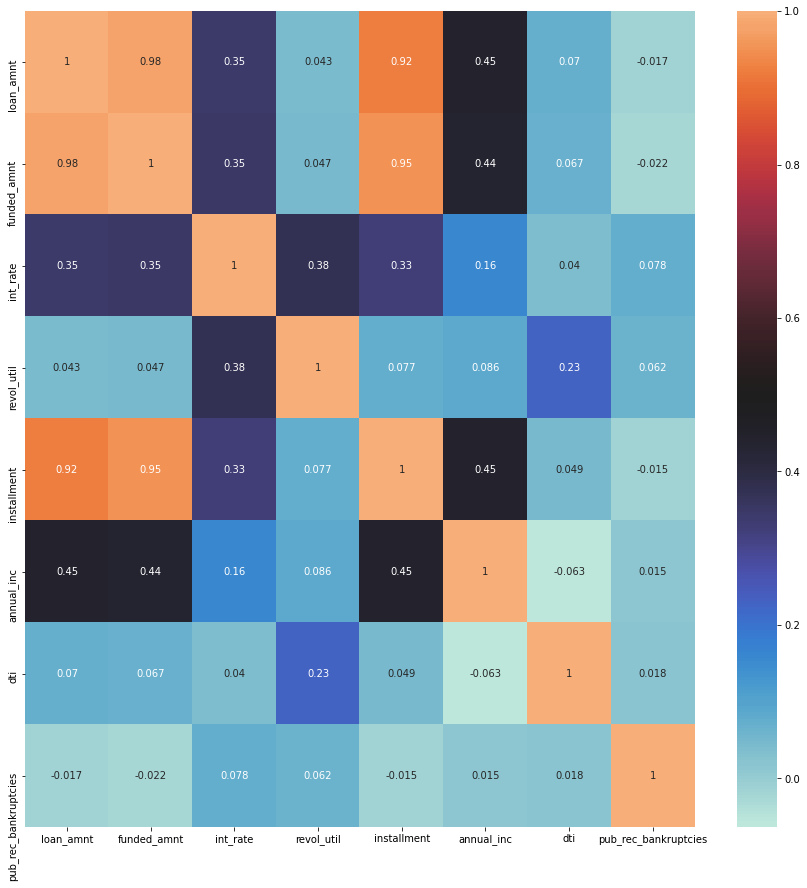

In [102]:
bivariateAnalysisContinous()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



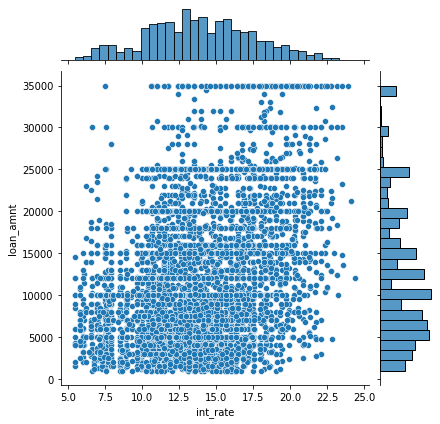

In [103]:
# loan amount and int_rate
sns.jointplot('int_rate', 'loan_amnt', charged_off_df)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



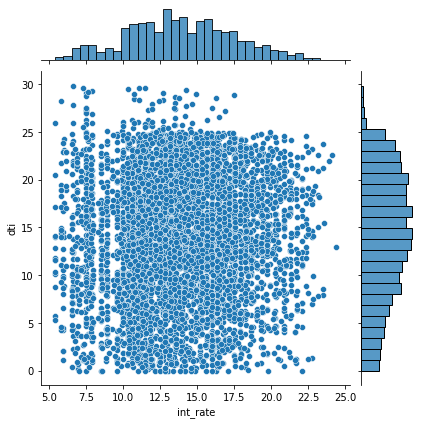

In [104]:
# DTI and int_rate
sns.jointplot('int_rate', 'dti', charged_off_df)

In [105]:
px.bar(charged_off_df, x = "income_bin",y="loan_amnt_bin",labels=[1,2,3,4])

In [106]:
charged_off_df.groupby(['income_bin','loan_amnt_bin']).count()

loan_amnt  funded_amnt   term  int_rate  \
income_bin loan_amnt_bin                                            
0          0-5k              132.00       132.00 132.00    132.00   
           5-10k              46.00        46.00  46.00     46.00   
           10-15k               nan          nan    nan       nan   
           15-20k               nan          nan    nan       nan   
           20-25k               nan          nan    nan       nan   
           25-30k               nan          nan    nan       nan   
           30-35k               nan          nan    nan       nan   
1          0-5k              429.00       429.00 429.00    429.00   
           5-10k             493.00       493.00 493.00    493.00   
           10-15k            238.00       238.00 238.00    238.00   
           15-20k             77.00        77.00  77.00     77.00   
           20-25k             14.00        14.00  14.00     14.00   
           25-30k               nan          nan    nan       nan   
           30-35k               nan          nan    nan       nan   
2          0-5k              368.00       368.00 368.00    368.00   
           5-10k             474.00       474.00 474.00    474.00   
           10-15k            314.00       314.00 314.00    314.00   
           15-20k            243.00       243.00 243.00    243.00   
           20-25k            118.00       118.00 118.00    118.00   
           25-30k             27.00        27.00  27.00     27.00   
           30-35k              8.00         8.00   8.00      8.00   
3          0-5k              167.00       167.00 167.00    167.00   
           5-10k             293.00       293.00 293.00    293.00   
           10-15k            242.00       242.00 242.00    242.00   
           15-20k            218.00       218.00 218.00    218.00   
           20-25k            128.00       128.00 128.00    128.00   
           25-30k             42.00        42.00  42.00     42.00   
           30-35k             45.00        45.00  45.00     45.00   
4          0-5k               54.00        54.00  54.00     54.00   
           5-10k             119.00       119.00 119.00    119.00   
           10-15k            108.00       108.00 108.00    108.00   
           15-20k             96.00        96.00  96.00     96.00   
           20-25k             95.00        95.00  95.00     95.00   
           25-30k             24.00        24.00  24.00     24.00   
           30-35k             50.00        50.00  50.00     50.00   
5          0-5k               18.00        18.00  18.00     18.00   
           5-10k              43.00        43.00  43.00     43.00   
           10-15k             33.00        33.00  33.00     33.00   
           15-20k             33.00        33.00  33.00     33.00   
           20-25k             59.00        59.00  59.00     59.00   
           25-30k             18.00        18.00  18.00     18.00   
           30-35k             26.00        26.00  26.00     26.00   
6          0-5k               13.00        13.00  13.00     13.00   
           5-10k              36.00        36.00  36.00     36.00   
           10-15k             31.00        31.00  31.00     31.00   
           15-20k             25.00        25.00  25.00     25.00   
           20-25k             36.00        36.00  36.00     36.00   
           25-30k             10.00        10.00  10.00     10.00   
           30-35k             20.00        20.00  20.00     20.00   
7          0-5k                7.00         7.00   7.00      7.00   
           5-10k              19.00        19.00  19.00     19.00   
           10-15k             14.00        14.00  14.00     14.00   
           15-20k              7.00         7.00   7.00      7.00   
           20-25k             22.00        22.00  22.00     22.00   
           25-30k              5.00         5.00   5.00      5.00   
           30-35k              8.00         8.00   8.00      8.00   
8          0-5k         